In [1]:
import os
import numpy as np
import pandas as pd
import math
import glob
from math import radians, sin, cos, asin, sqrt
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import seaborn as sns

In [3]:
os.chdir("/home/fmenar/projects/project_tritici_fabrizio/analysis/sparg/")

In [4]:
metadata_file = "~/projects/vcf_project_tritici/2022+before2022+2023+ncsu_metadata+fs+admxK9_03052024.csv"
samples_file= "../Relate/2022_2023.sample"# create location df


df = pd.read_csv(metadata_file)

locations = df[['Sample.Name','Latitude', 'Longitude','fs_level_4']]

#print(locations)

# Read the sample file
samp = pd.read_csv(samples_file, delimiter=" ", skiprows=1)

# Filter rows based on matching values in "Samples.Names" column and first column
first_column_values = samp.iloc[:, 0]
matching_rows = locations[locations["Sample.Name"].isin(first_column_values)]

matching_rows = matching_rows.set_index("Sample.Name").loc[first_column_values].reset_index()


reordered_locations= matching_rows[['Longitude', 'Latitude']].to_numpy()

samples_ix = matching_rows[['Sample.Name']].to_numpy()

pop_ix = matching_rows[['fs_level_4']].to_numpy()

lat= matching_rows[['Latitude']]#.to_numpy()
lon= matching_rows[['Longitude']]#.to_numpy()

mean_lat =lat.mean()
mean_lon =lon.mean()

locations= np.array(reordered_locations)
pop_ix = pop_ix.reshape(-1) # Flatten the array
pop_ix_f=pd.factorize(pop_ix)



In [23]:
pop_ix_f

(array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
        0, 0, 0, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 2, 0, 1, 1, 2, 2, 2, 0,
        2, 0, 1, 0, 2, 1, 1, 1, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array(['N_EUR', 'S_EUR2', 'S_EUR1', 'ME', 'TUR'], dtype=object))

In [5]:
def haversine(loc1, loc2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [loc1[0], loc1[1], loc2[0], loc2[1]])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles
    return c * r

In [6]:
mle = np.load("random_250.1000_trees.tcut.mle.npy")
#mle = np.load("100mut.1000_trees.tcut.mle.npy")

def deg2rad(deg):
    return (deg * math.pi) / 180


dispersal = []

dispersal.append(mle[0]*(111.320*math.cos(deg2rad(mean_lat))))
dispersal.append(mle[1]*110.574)

print(dispersal)




[208.70983205663524, 142.88602975739684]


/sctmp/fmenar/ipykernel_1765754/1718609499.py:10: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  dispersal.append(mle[0]*(111.320*math.cos(deg2rad(mean_lat))))


In [7]:
disp_lon=haversine([10,mean_lat],[12.76806516,mean_lat])
disp_lat=haversine([10,mean_lat],[10,mean_lat+1.26440135])

print(disp_lon)
print(disp_lat)
print(disp_lon/disp_lat)

209.44125780238232
140.59501536253111
1.4896776906516054


/sctmp/fmenar/ipykernel_1765754/1233953422.py:7: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  lon1, lat1, lon2, lat2 = map(radians, [loc1[0], loc1[1], loc2[0], loc2[1]])


In [8]:
#anc1 = np.load("data_100mut/100mut.chr1.0.anc-locs.npy")

anc_locs = []

search_pattern = os.path.join("data_random/", "*anc-locs-full-set.npy")
files = glob.glob(search_pattern)

for file in files:
    anc_locs.append(np.load(file))

anc_locs = np.array(anc_locs)

n= anc_locs.shape[1] # n of samples
anc_locs.shape

(358, 255, 10, 2)

In [40]:
time_ix = 3 #choose which time to get ancestor locations at... [0,1,2,3,4,5,10,25,50,100]
disps = []
mean_locs=[]
for sample in range(n):

    locs = anc_locs[:,sample,time_ix]
#     row_mask = (locs != locations[sample]).all(axis=1)
#     locs = locs[row_mask,:] #exclude subtrees that contain only the sample
    mean_loc = np.mean(locs, axis=0)
    disp = mean_loc - locations[sample]
    disps.append(disp)
    mean_locs.append(mean_loc)

In [41]:
dists = [haversine(locations[i], mean_locs[i]) for i,disp in enumerate(disps)]
relative_dists = dists/np.max(dists)
np.mean(dists)

129.02050912378672

In [38]:
pop_indices = pop_ix_f[0]
pop_names = pop_ix_f[1]
pop_colors = {
    'ME': '#984EA3',
    'N_EUR': '#377EB8',
    'S_EUR1': '#EA9999',
    'S_EUR2': '#E41A1C',
    'TUR': '#E5B110'
}


mean ancestor locations 5 generations ago


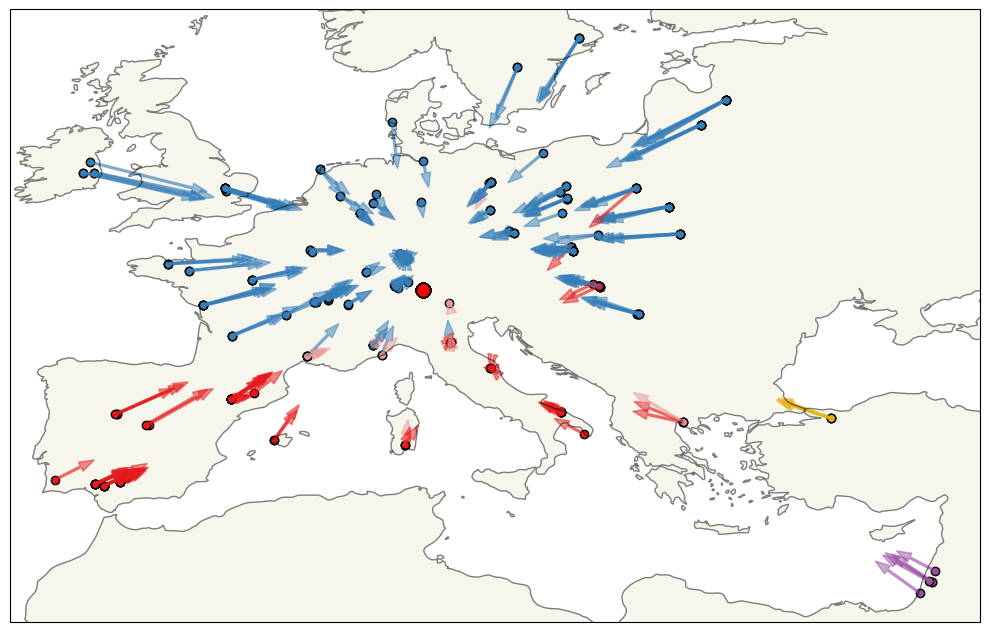

In [39]:


# plot map
print ("mean ancestor locations 5 generations ago")
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(projection=ccrs.PlateCarree())
    
for i,disp in enumerate(disps):
#    cmap = plt.get_cmap('viridis')
#    color = cmap(relative_dists[i])
#    color = plt.cm.tab10(pop_ix_f[i])
    pop_name = pop_names[pop_indices[i]]
    color = pop_colors[pop_name]
    ax.scatter(locations[i,0], locations[i,1], color=color, edgecolor='k', zorder=0)
    ax.scatter(mean_lon, mean_lat, color="red", edgecolor='k', zorder=0,s=100)

    ax.arrow(locations[i,0], locations[i,1], disp[0], disp[1], transform=ccrs.PlateCarree(),
             head_width=0.5, length_includes_head=True, width=0.1, alpha=0.5, color=color)

ax.coastlines(resolution='50m', alpha=0.5)
ax.add_feature(cfeature.LAND, alpha=0.5)

#cbar = fig.colorbar(plt.cm.ScalarMappable(norm=None, cmap=cmap), ax=ax, orientation='horizontal', pad=-0.1, shrink=0.5)
#cbar.set_ticks([i/4 for i in range(5)])
#cbar.set_ticklabels([round(i*max(dists)/4) for i in range(5)])
#cbar.set_label('mean kms travelled in past %d generations' %int(ancestor_times[time_ix]), fontsize=14)
#cbar.ax.tick_params(labelsize=14)

plt.tight_layout()
#plt.savefig('ancestral_locations.png')
#plt.savefig('ancestral_locations.pdf')
plt.show()



In [17]:
cmaps = [plt.cm.Blues, plt.cm.Reds, plt.cm.RdPu, plt.cm.Oranges, plt.cm.Purples] #to roughly align with color scheme above

def ancestor_clouds(sample, extent=None, time_ixs = range(0,3), levels=10, bw_adjust=1, filename=None):
    
    cmap = cmaps[pop_ix_f[0][sample]]

    fig, axs = plt.subplots(1,len(time_ixs),figsize=(5*len(time_ixs), 5),subplot_kw={'projection': ccrs.PlateCarree()})

    print(samples_ix[sample])
    for ax,time_ix in zip(axs,time_ixs):
        
        #print(int(ancestor_times[time_ix]))
        
        locs = anc_locs[:,sample,time_ix]
#         row_mask = (locs != locations[sample]).all(axis=1)
#         locs = locs[row_mask,:] #exclude subtrees that contain only the sample
    
        sns.kdeplot(x=locs[:,0], y=locs[:,1], transform=ccrs.PlateCarree(), ax=ax, levels=levels, bw_adjust=bw_adjust, zorder=0,color=plt.cm.tab10(pop_ix_f[0][sample]))#fill=True, , cmap=cmap, , )
        ax.scatter(locs[:,0], locs[:,1], transform=ccrs.PlateCarree(), alpha=0.1, color=plt.cm.tab10(pop_ix_f[0][sample]))# , color=plt.cm.tab10(population_ixs[sample])

        ax.scatter(locations[sample,0], locations[sample,1], transform=ccrs.PlateCarree(),  edgecolor='k', color=plt.cm.tab10(pop_ix_f[0][sample])) # color=plt.cm.tab10(population_ixs[sample]),
#         ax.scatter(locations[:,0], locations[:,1], transform=ccrs.PlateCarree(), color=plt.cm.tab10(population_ixs), alpha=0.1)
        
#         ax.set_title(int(ancestor_times[time_ix]))
        ax.coastlines(resolution='50m', alpha=0.5)
        ax.add_feature(cfeature.LAND, alpha=0.5)
        
        if extent is not None:
            ax.set_extent(extent, crs=ccrs.PlateCarree())

    plt.tight_layout()
    
    if filename is not None:
        plt.savefig(filename)
        
    plt.show()


plot ancestor location cloudes at 2,5,10 and 50 generations ago for a subset of samples

['HUMV062226']


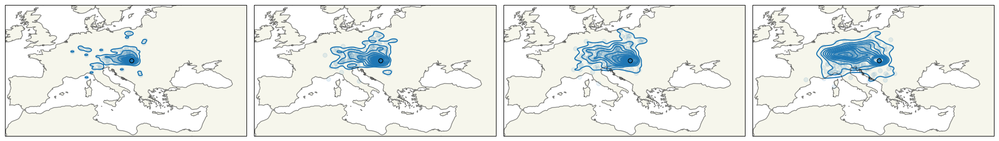

['HUMV062227']


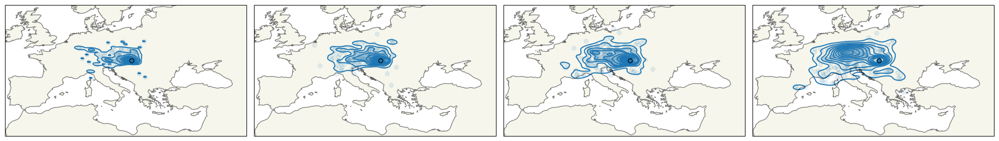

['HUMV062231']


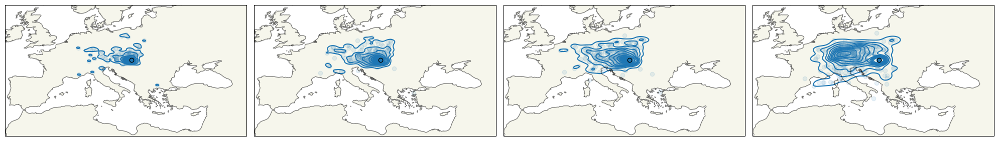

['HUMV062309']


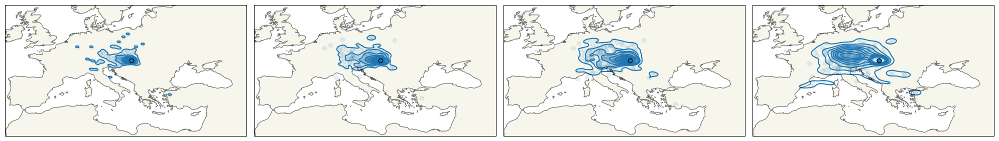

['HUMV062323']


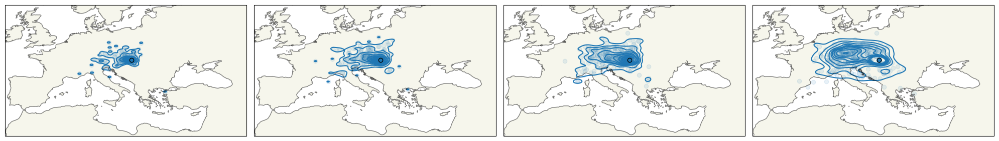

['HUMV062350']


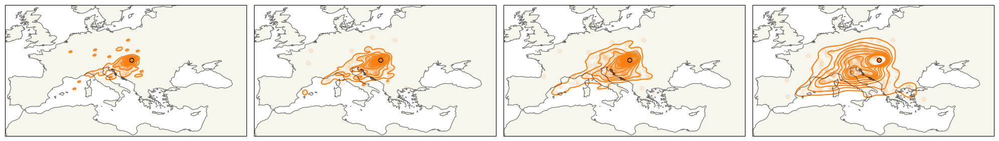

['HUSZ062201']


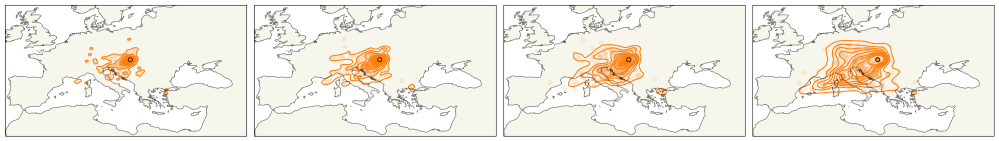

['IEKD072305']


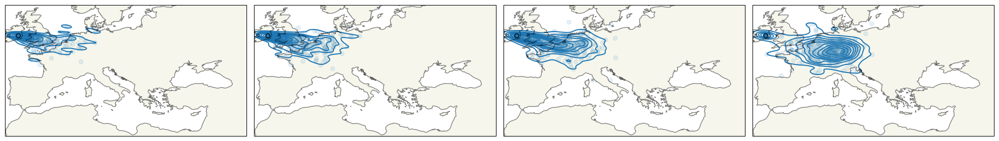

['IEKD072313']


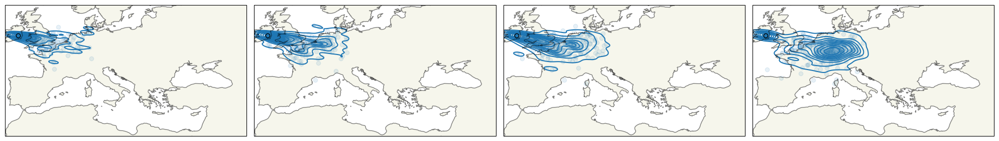

['IELO072305']


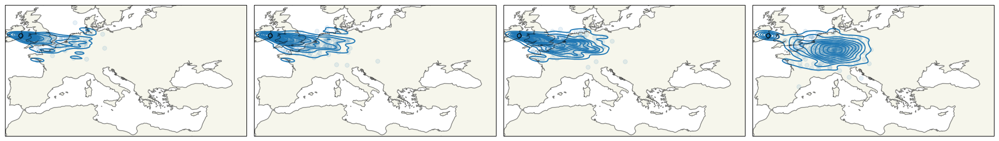

['IELO072310']


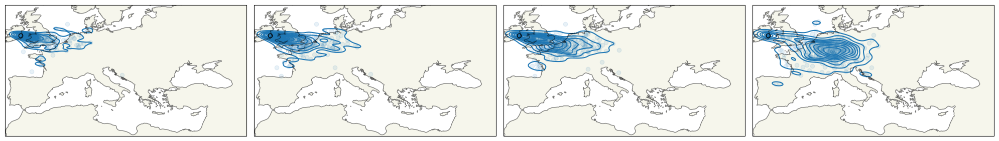

['IEME072202']


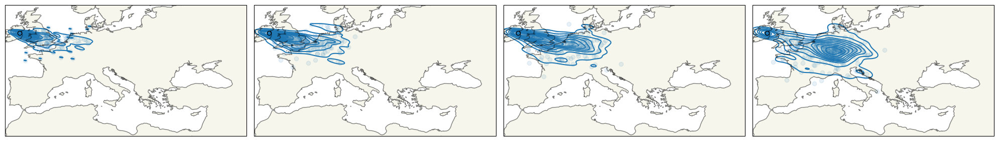

['ILIL042201']


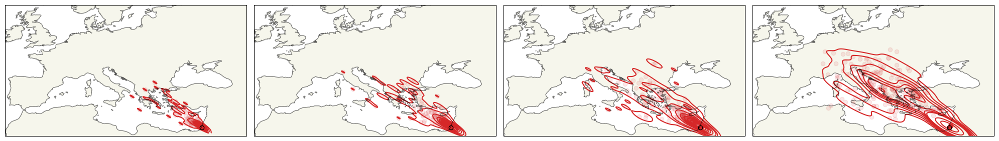

['ILIL042215']


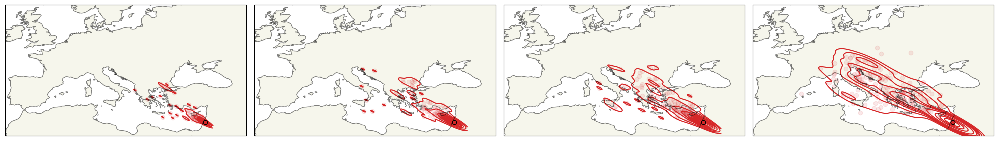

['ILIL042254']


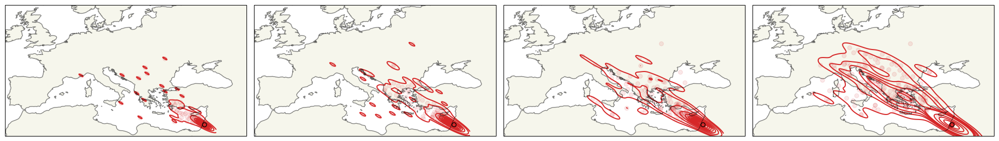

['ILIL042256']


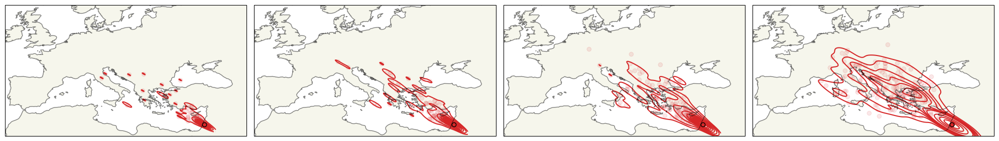

['ILIL042271']


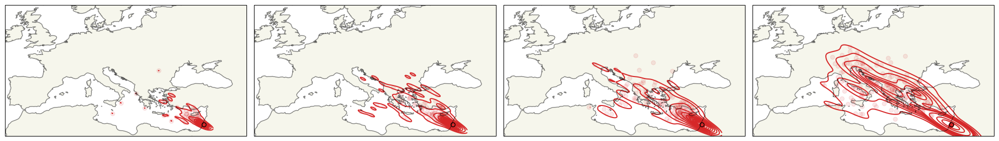

['ITBA022201']


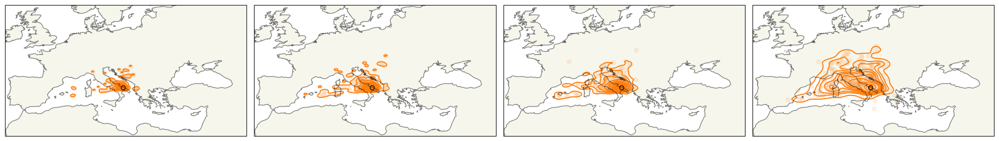

['ITBA022210']


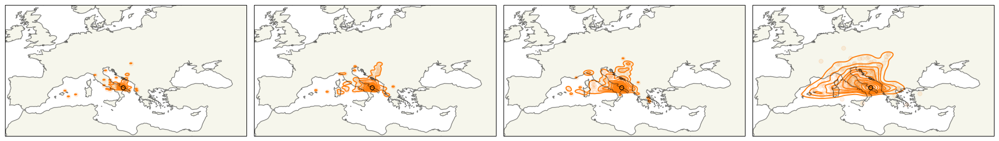

['ITBA022213']


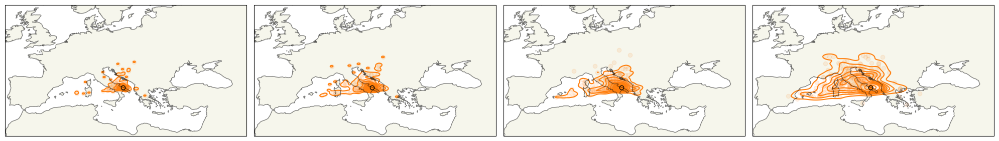

['ITBA022218']


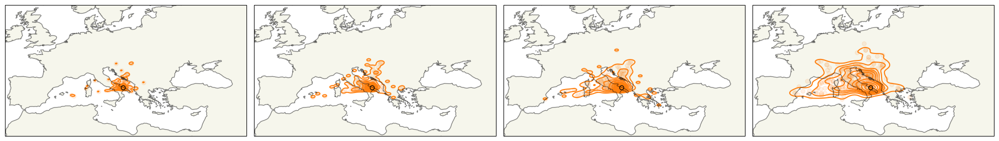

['ITBA022222']


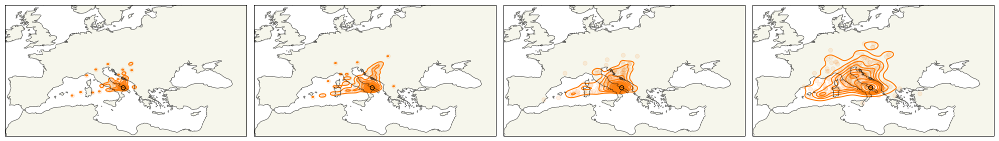

['ITBA062301']


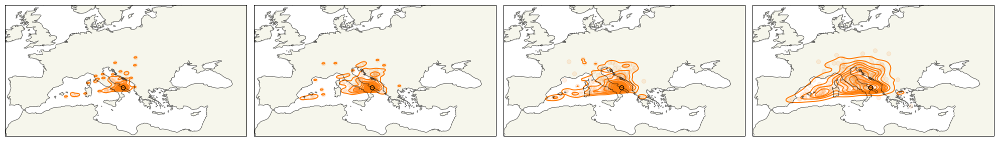

['ITBO052301']


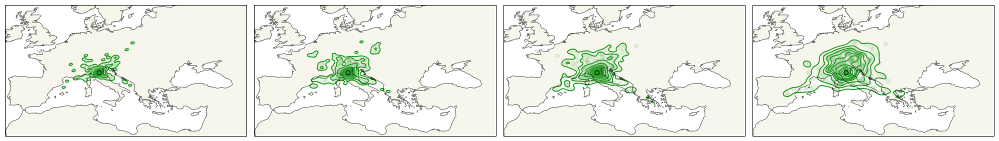

['ITBO052302']


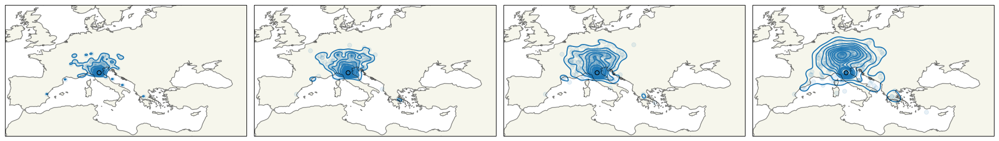

['ITBO062201']


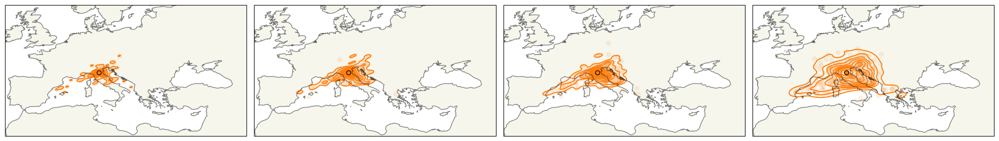

['ITBO062202']


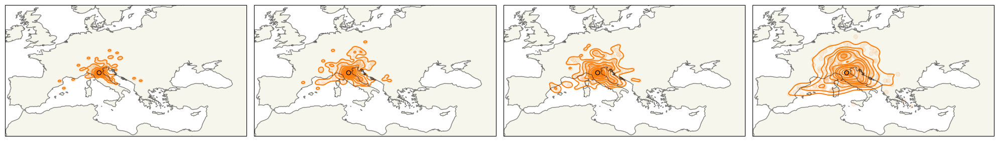

['ITBO062203']


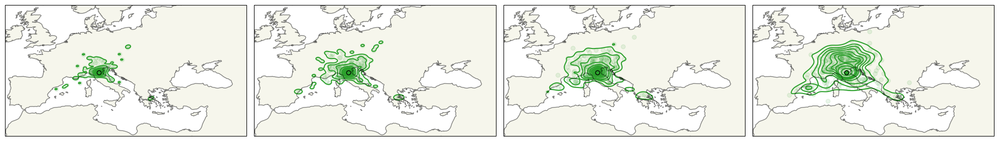

['ITBZ042301']


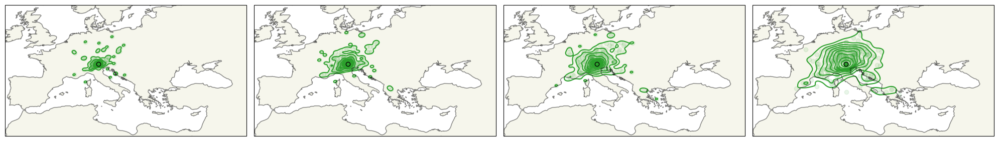

['ITCN042301']


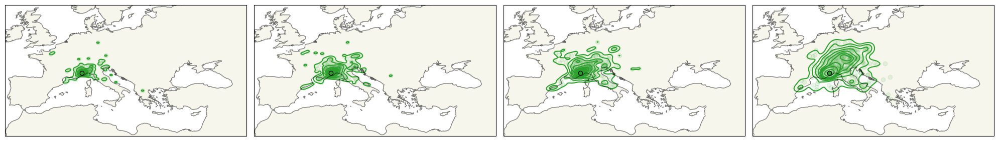

In [22]:
extent = [-10,45,30,60]
for i in range (145,175):
    ancestor_clouds(i, extent=extent, bw_adjust=0.75, time_ixs = [2,5,6,8], filename=None)